# NuclearPy - Analysis

This interactive notebook describes the workflow to analyze data from segmented images that were previously processed by NuclearPy. We will show how to import, visualise, filter and cluster the data using robust, simple-to-use functions. Many of these functions take up positional arguments that can be modified. To display the usage of these functions, run help(name_of_function).

## Pre-requisite

Please make sure that `NuclearPy` is successfully installed on your local computer. Installation instructions can be found on `NuclearPy` [GitHub repository](https://github.com/f-hamidlab/nuclearpy).


We begin by importing the Analyzor class from `nuclearpy` module.

In [1]:
from nuclearpy.analyzer import Analyzor

## Create Analyzor object class

We provide an Analyzor object class that facilitates storage of nuclei segmented data and its downstream processing. To construct this object, we can easily pass the path to Segmentador output directory to `Analyzor` class function:

In [4]:
obj = Analyzor("../data/sample_output/")

## Data preprocessing

### Normalize DAPI intensity

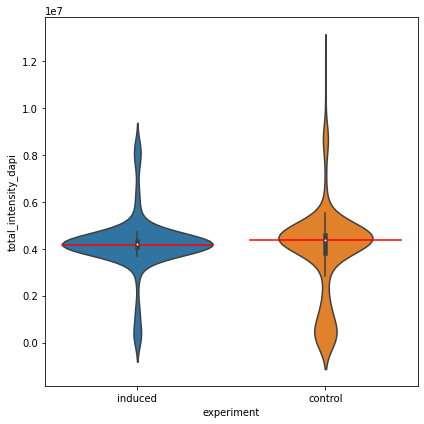

In [5]:
obj.normChannel(channel = "dapi", method = "mode", nbins = 40, intensity_type = "total")

### Select single cells
Identify single cells based on DNA marker content. (Here we have to give the option to select the range of the spread we want to have from sum of DAPI intensity.

In [5]:
obj.filterCells(filter = "nuclear_area > 35", inplace = True)
obj.filterCells(filter = "nuclear_area <= 200", inplace = True)

In [6]:
%matplotlib tk
selected_cells = obj.chooseCells(x = "nuclear_area", y = "avg_intensity_dapi")

In [7]:
%matplotlib inline

In [8]:
obj.filterCells(cells = selected_cells, inplace = True)

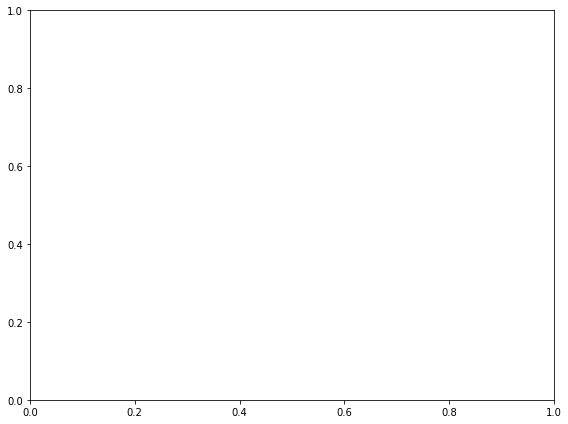

In [32]:
obj.plotData(x = "nuclear_area", y = "avg_intensity_dapi")

In [9]:
obj.findSingleCells(byExperiment = True, nbins = 40, spread = 0.4, channel = None)

Using dapi channel for qualifying single cells


100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 208.04it/s]


In [10]:
# Keep only single cells
obj.filterCells(filter = "isSingleCell == True", inplace = True)

### Normalize channel intensities

In [11]:
obj.showADataVars()

['avg_intensity_dapi',
 'nuclear_area',
 'nuclear_perimeter',
 'major_axis',
 'minor_axis',
 'axes_ratio',
 'circularity',
 'eccentricity',
 'solidity',
 'avg_intensity_core_dapi',
 'avg_intensity_internal_ring_dapi',
 'avg_intensity_external_ring_dapi',
 'total_intensity_core_dapi',
 'total_intensity_internal_ring_dapi',
 'total_intensity_external_ring_dapi',
 'total_intensity_dapi',
 'avg_intensity_b3',
 'total_intensity_b3',
 'avg_intensity_rfp',
 'total_intensity_rfp',
 'avg_intensity_lamB',
 'total_intensity_lamB',
 'b3_x_rfp',
 'b3_x_lamB',
 'rfp_x_lamB',
 'b3_x_rfp_x_lamB',
 'dna_peaks',
 'dna_dots',
 'dna_dots_size_median',
 'spatial_entropy']

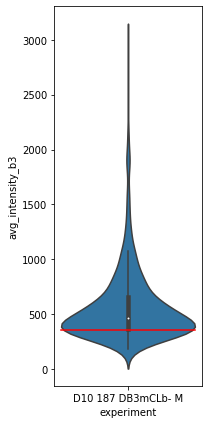

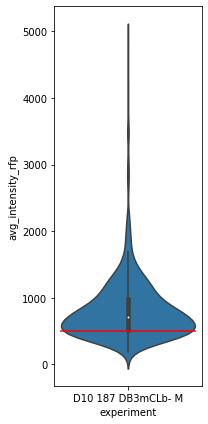

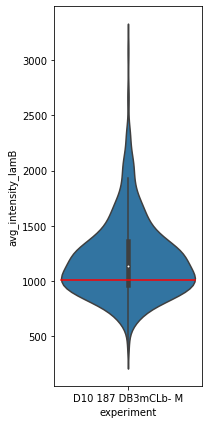

In [12]:
obj.normChannel(channel = "b3", method = "mode", nbins = 40, intensity_type = "avg")
obj.normChannel(channel = "rfp", method = "mode", nbins = 100, intensity_type = "avg")
obj.normChannel(channel = "lamB", method = "mode", nbins = 100, intensity_type = "avg")

### Filter cells

In [13]:
obj.count(["b3_group","lamB_group"], sort = False)

b3_group  lamB_group
0         1               2
          2               6
          3               1
1         1               3
          2             307
          3             114
          4               1
2         1               1
          2             145
          3             171
          4               7
3         1               1
          2              10
          3              45
          4              15
4         3               1
          4               2
dtype: int64

In [14]:
%matplotlib tk
chosen_cells = obj.chooseCells(x = "b3_group", y = "rfp_group")

In [15]:
%matplotlib inline


Showing 30 cells of a total of 832 in the selected data


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:04<00:00,  6.49it/s]


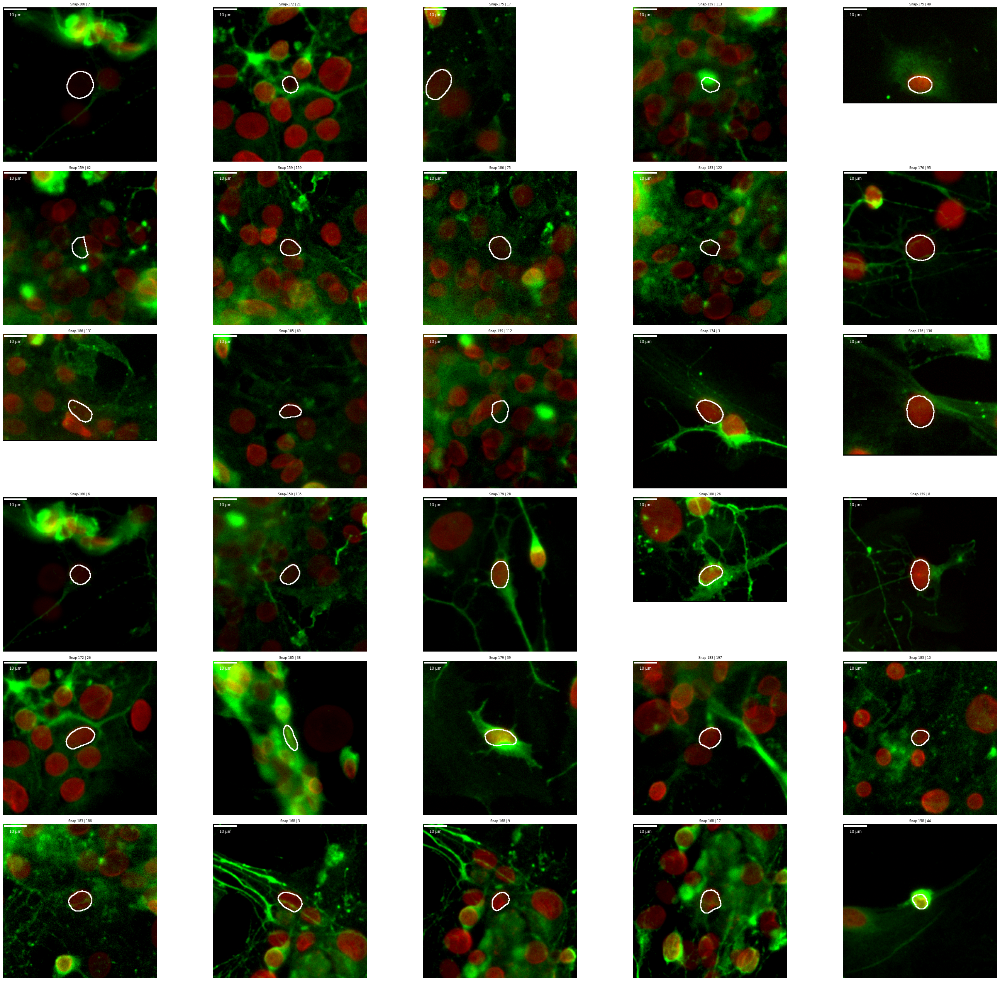

In [16]:
obj.showCells(n=30, ch2show = {'red': "lamB", 'green': "b3"}, 
              order_by = "avg_intensity_lamB", ascending = True, 
             filter = None, show_nucleus = False)

In [17]:
obj.filterCells(cells = chosen_cells)

In [18]:
obj.count(["lamB_group","b3_group"])

lamB_group  b3_group
1           2             1
            3             1
2           2           119
            3            10
3           2           151
            3            45
            4             1
4           2             6
            3            15
            4             2
dtype: int64

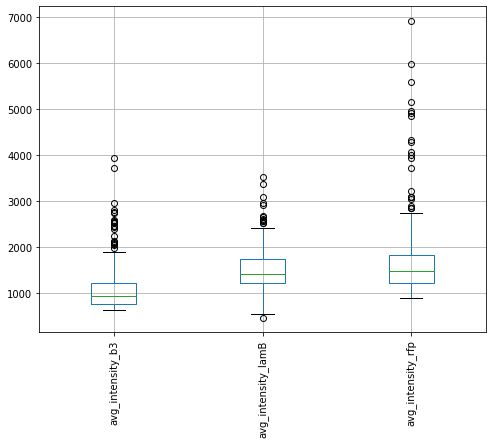

In [19]:
obj.plotVarDist(["avg_intensity_b3", "avg_intensity_lamB", "avg_intensity_rfp"])



Showing 30 cells of a total of 351 in the selected data


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 14.48it/s]


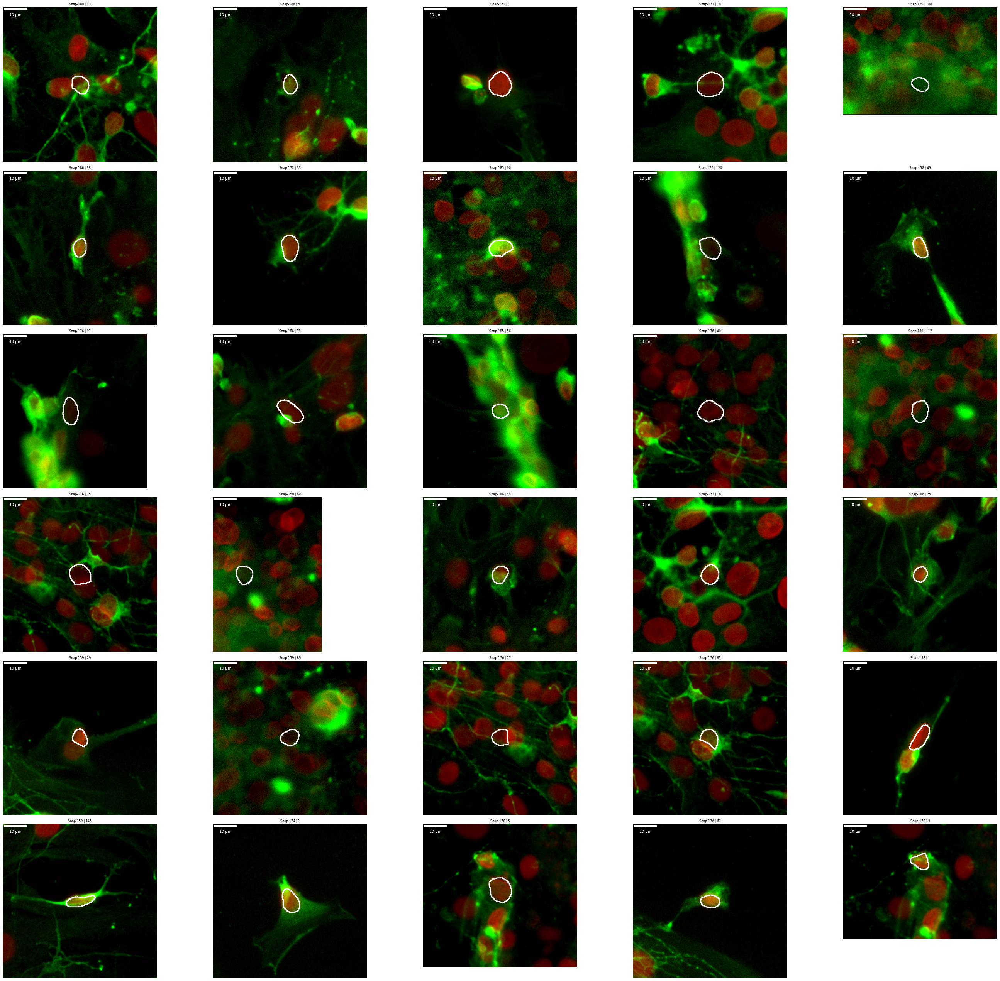

In [20]:
obj.showCells(n=30, ch2show = {'red': "lamB", 'green': "b3"}, 
              order_by = "avg_intensity_rfp", ascending = True, 
             filter = None, show_nucleus = False)

## Dimensional reduction and clustering

### Prepare matrix

Below are the nuclear features used for dimensional reduction

In [21]:
obj.showADataVars()


['avg_intensity_dapi',
 'nuclear_area',
 'nuclear_perimeter',
 'major_axis',
 'minor_axis',
 'axes_ratio',
 'circularity',
 'eccentricity',
 'solidity',
 'avg_intensity_core_dapi',
 'avg_intensity_internal_ring_dapi',
 'avg_intensity_external_ring_dapi',
 'total_intensity_core_dapi',
 'total_intensity_internal_ring_dapi',
 'total_intensity_external_ring_dapi',
 'total_intensity_dapi',
 'avg_intensity_b3',
 'total_intensity_b3',
 'avg_intensity_rfp',
 'total_intensity_rfp',
 'avg_intensity_lamB',
 'total_intensity_lamB',
 'b3_x_rfp',
 'b3_x_lamB',
 'rfp_x_lamB',
 'b3_x_rfp_x_lamB',
 'dna_peaks',
 'dna_dots',
 'dna_dots_size_median',
 'spatial_entropy']

In [22]:
exclude_feat = ['total_intensity_dapi', 'b3_x_rfp', 'b3_x_lamB', 'rfp_x_lamB', 'b3_x_rfp_x_lamB',
               'total_intensity_b3', 'total_intensity_lamB','total_intensity_rfp', 'total_intensity_core_dapi', 
                'total_intensity_internal_ring_dapi', 'total_intensity_external_ring_dapi']
obj.excludeVars(vars = exclude_feat)
obj.showADataVars()

['avg_intensity_dapi',
 'nuclear_area',
 'nuclear_perimeter',
 'major_axis',
 'minor_axis',
 'axes_ratio',
 'circularity',
 'eccentricity',
 'solidity',
 'avg_intensity_core_dapi',
 'avg_intensity_internal_ring_dapi',
 'avg_intensity_external_ring_dapi',
 'avg_intensity_b3',
 'avg_intensity_rfp',
 'avg_intensity_lamB',
 'dna_peaks',
 'dna_dots',
 'dna_dots_size_median',
 'spatial_entropy']

In [29]:
## This graphic should be before

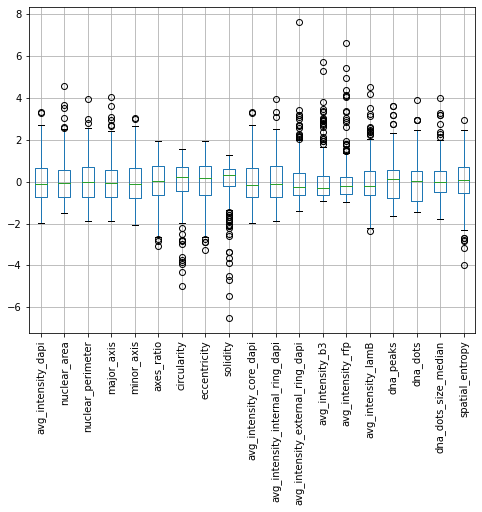

In [23]:
obj.plotVarDist(vars = "all", data_type="scaled")

In [31]:
# optional rescaling
obj.normAData(method = "maxabsscaler")

### Cluster and dim reduction

In [24]:
obj.findNeighbours(method = "umap")
obj.findClusters(method = "leiden", res=0.5)
obj.runDimReduc(method = "umap")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


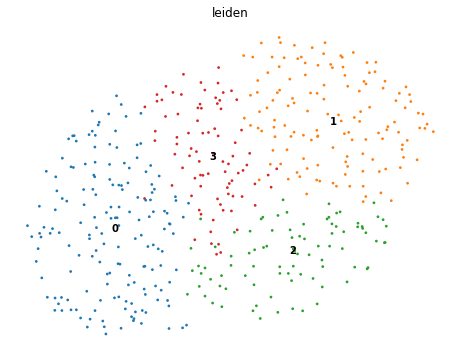

In [33]:
# Plot UMAP showing features
obj.plotDim(hue = "leiden", method="umap")

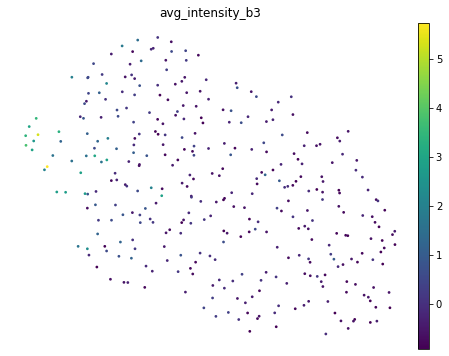

In [25]:
obj.plotDim(hue = "avg_intensity_b3", method="umap")

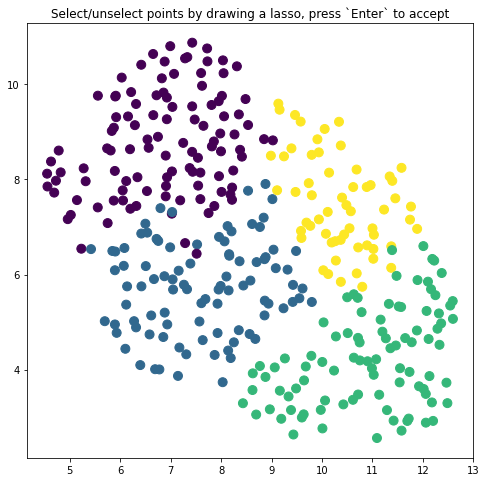

{'cells': ''}

In [35]:
obj.chooseCells(reduction = "umap", hue = "leiden")

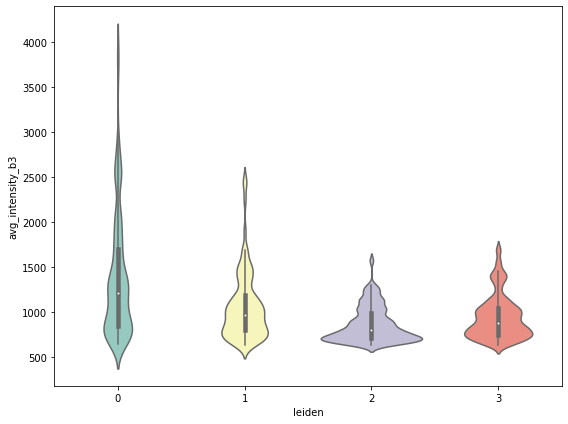

In [27]:
obj.plotData(x="leiden", y = "avg_intensity_b3", plot_type = "violin")

In [28]:
dat_vars = obj.data['norm'].copy()
dat_vars

,cellID,avg_intensity_dapi,nuclear_area,nuclear_perimeter,major_axis,minor_axis,axes_ratio,circularity,eccentricity,solidity,...,spatial_entropy,b3_group,rfp_group,lamB_group,experiment,path2ong,isSingleCell,leiden,umap_1,umap_2
Snap-158-1,1,1226,62,33,13.5,5.9,0.435,0.696,0.901,0.958,...,3.775,3,3,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,1,6.313400,4.889366
Snap-158-2,2,1321,55,29,10.5,6.6,0.628,0.833,0.778,0.966,...,3.711,4,4,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,0,5.019193,7.254027
Snap-158-7,7,1287,53,28,9.0,7.5,0.839,0.876,0.544,0.958,...,3.648,2,2,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,3,9.476496,7.737510
Snap-158-9,9,1050,62,30,11.7,6.8,0.587,0.847,0.809,0.974,...,3.779,2,2,2,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,1,8.678556,4.646232
Snap-158-12,12,1326,66,31,10.2,8.4,0.819,0.851,0.574,0.952,...,3.774,3,3,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,3,9.768815,7.025303
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Snap-186-46,46,1768,47,25,8.6,7.0,0.810,0.924,0.587,0.977,...,3.716,2,2,2,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,0,7.952778,9.646548
Snap-186-48,48,2017,38,23,8.1,6.0,0.736,0.895,0.677,0.968,...,3.741,2,3,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,0,6.215756,9.837899
Snap-186-55,55,1791,48,26,9.5,6.5,0.692,0.878,0.722,0.974,...,3.733,3,3,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,0,6.540279,8.841715
Snap-186-77,77,1998,44,25,7.9,7.1,0.903,0.920,0.429,0.974,...,3.745,2,2,3,D10 187 DB3mCLb- M,F:\Soumya\GOOD STAININGS\Day 10\D10 187 DB3mCL...,True,0,7.285086,10.546383


In [29]:
obj.showCells(RGB_contrasts=[4,3,4], n=5, ch2show={'red':'lamB', 'green':'b3'}, filter = "leiden == '2'")

ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required by StandardScaler.

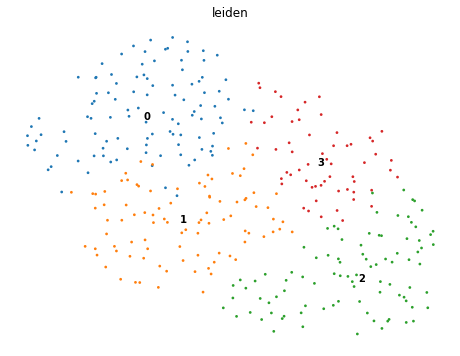

In [30]:
# Plot UMAP showing features
obj.plotDim(hue = "leiden", method="umap")

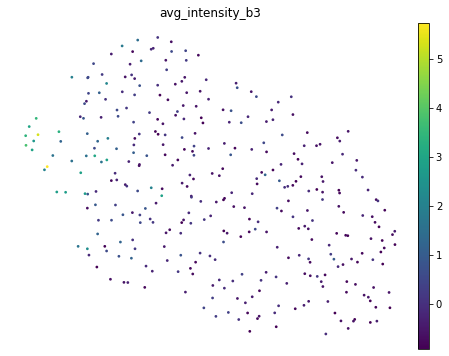

In [32]:
obj.plotDim(hue = "avg_intensity_b3", method="umap")

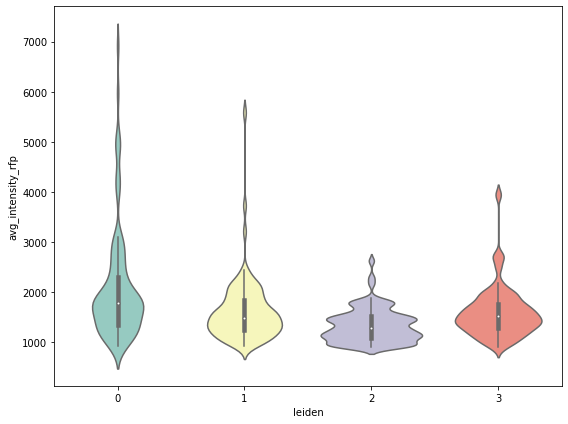

In [33]:
obj.plotData(x="leiden", y = "avg_intensity_rfp", plot_type = "violin")

In [34]:
obj.showCell(RGB_contrasts=[4,3,4], n=5, ch2show={'red':'rfp', 'green':'beta3'}, filter = "leiden == '0'")

AttributeError: 'Analyzor' object has no attribute 'showCell'

In [ ]:
clust1 = obj.filterCells(filter = "leiden == '1'", inplace=False)
clust1.plotData(x = "", y = "")

#### DIFFMAP

In [ ]:
obj.findNeighbours(method = "umap")
obj.findClusters(method = "leiden")
obj.runDimReduc(method = "diffmap")

In [ ]:
obj.plotDim(hue = "leiden", method="diffmap")

In [ ]:
obj.plotDim(hue = "avg_intensity_Mcm2", method="diffmap")

#### Pseudotime
Choose a root cell for diffusion pseudotime:

In [ ]:
%matplotlib tk
root_cells = obj.chooseCells(reduction = "diffmap")

In [ ]:
%matplotlib inline

In [ ]:
obj.runPT(root_cells = root_cells)

In [ ]:
obj.plotDim(hue = "dpt_pseudotime", method="diffmap")

#### Stacked violin plot

In [ ]:
fig, ax = plt.subplots(figsize = (5, 7))
sc.pl.stacked_violin(adata, data_cols, groupby = 'experiment', swap_axes = True, ax = ax, dendrogram = True)
fig.tight_layout()
plt.show()

#### Pseudotime - heatmap

In [ ]:
# Enter order of clusters in pseudotime
pseudotime_path = [3,4,7]

In [ ]:
# Heatmap - pseudotime
sc.pl.paga_path(
    adata, 
    pseudotime_path, 
    data_cols,
    show_node_names = True,
    n_avg = 50,
    annotations = ['dpt_pseudotime'],
    show_colorbar = True,
    color_map = 'coolwarm',
    groups_key = 'leiden',
    color_maps_annotations = {'dpt_pseudotime': 'viridis'},
    title = 'Path',
    return_data = False,
    normalize_to_zero_one = True,
    show = True
)

### Save Object

In [36]:
import pickle 

# to save object as pickle
picklefile = "output.pkl"
with open(picklefile, 'wb') as outp:
    pickle.dump(obj, outp)
    
# to load same object 
with open(picklefile, 'rb') as inp:
    obj2 = pickle.load(inp)